# Machine Learning Final Project

Drone Image DataSet Prediction Part

This Notebook Uses the pretrained model from part trained model for detection. We had three epoches with batch size of 5000 per epoch . 



In [ ]:
from google.colab import drive 
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/My\ Drive/project/main/Mask_RCNN

/content/drive/My Drive/project/main/Mask_RCNN


In [ ]:
!pip uninstall -y tensorflow
!pip install tensorflow-gpu==1.14
!pip install keras==2.2.4

Uninstalling tensorflow-2.3.0:
  Successfully uninstalled tensorflow-2.3.0
     |████████████████████████████████| 377.0MB 43kB/s 
     |████████████████████████████████| 51kB 5.9MB/s 
     |████████████████████████████████| 3.2MB 65.5MB/s 
     |████████████████████████████████| 491kB 61.5MB/s 
  Found existing installation: tensorboard 2.3.0
    Uninstalling tensorboard-2.3.0:
      Successfully uninstalled tensorboard-2.3.0
  Found existing installation: tensorflow-estimator 2.3.0
    Uninstalling tensorflow-estimator-2.3.0:
      Successfully uninstalled tensorflow-estimator-2.3.0
     |████████████████████████████████| 317kB 13.5MB/s 
ERROR: fancyimpute 0.4.3 requires tensorflow, which is not installed.
  Found existing installation: Keras 2.4.3
    Uninstalling Keras-2.4.3:
      Successfully uninstalled Keras-2.4.3


#Loading Libraries

In [13]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from mrcnn.model import MaskRCNN  
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log
import train
import matplotlib.image as mpi

Assigning the root directory

In [ ]:
ROOT_DIR = os.path.abspath("/content/drive/MyDrive/project")

In [ ]:
%matplotlib inline 

Setting Confiuration with 70% minimum confidence, 512 train anchors per image, 0.4 nms threshold.

since few objects are small with high confidence the objects will not be reconised especially in the low contrast images. we believe 70% is ideal. if we go less that 70 more objects will be recognised but chances of wrongly predicting an object will also high

In [ ]:
MODEL_DIR = os.path.join(ROOT_DIR, "logs")
BALLON_WEIGHTS_PATH = "/content/drive/MyDrive/project/object20201207T1800/mask_rcnn_object_0001.h5"  
config = train.CustomConfig()
CUSTOM_DIR = os.path.join(ROOT_DIR, "dataset")
class InferenceConfig(config.__class__):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    DETECTION_MIN_CONFIDENCE = 0.7
    DETECTION_NMS_THRESHOLD = 0.4
    ROI_POSITIVE_RATIO = 0.6
    RPN_ANCHOR_SCALES = (16, 32, 64, 128, 256)
    RPN_NMS_THRESHOLD = 0.6
    RPN_TRAIN_ANCHORS_PER_IMAGE=512
config = InferenceConfig()
config.display()
DEVICE = "/gpu:0" 
TEST_MODE = "inference"


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.4
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                18
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

#Training custom data and data preperation 

In [ ]:
def get_ax(rows=1, cols=1, size=16):
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax
 

dataset = train.CustomDataset()
dataset.load_custom(CUSTOM_DIR, "val")

dataset.prepare()
 
print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))


objects: ['Head', 'Thread', 'Nut', 'Head', 'Head', 'Nut', 'Thread']
numids [5, 3, 1, 5, 5, 1, 3]
objects: ['Head', 'Head']
numids [5, 5]
objects: ['Head', 'Head']
numids [5, 5]
objects: ['Nut', 'Thread', 'Pin', 'Head', 'Thread', 'Thread', 'Nut', 'Nut', 'Head', 'Head', 'Head', 'Head', 'Nut', 'Thread', 'Thread', 'Pin', 'Nut', 'Washer', 'Nut', 'Thread']
numids [1, 3, 2, 5, 3, 3, 1, 1, 5, 5, 5, 5, 1, 3, 3, 2, 1, 4, 1, 3]
objects: ['Head', 'Head', 'Head', 'Head', 'Head', 'Head', 'Head', 'Head']
numids [5, 5, 5, 5, 5, 5, 5, 5]
objects: ['Head']
numids [5]
objects: ['Nut', 'Head', 'Head']
numids [1, 5, 5]
objects: ['Head', 'Head', 'Head', 'Head', 'Head', 'Head', 'Head', 'Head', 'Nut', 'Nut', 'Thread', 'Thread', 'Thread', 'Nut', 'Nut', 'Nut', 'Thread', 'Thread', 'Thread', 'Nut', 'Nut', 'Nut']
numids [5, 5, 5, 5, 5, 5, 5, 5, 1, 1, 3, 3, 3, 1, 1, 1, 3, 3, 3, 1, 1, 1]
objects: ['Head', 'Head', 'Head', 'Head', 'Head', 'Head', 'Head', 'Head', 'Thread', 'Nut', 'Thread', 'Thread', 'Nut', 'Nut', 'Thre

#Loading the model

In [ ]:
model_path = '/content/drive/MyDrive/project/object20201207T1800/mask_rcnn_object_0002.h5'
model = MaskRCNN(mode="inference", model_dir='./', config=config)
model.load_weights(model_path, by_name=True)
#model.load_weights(weights_path, by_name=True,exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"])

Re-starting from epoch 2


Reading image and visualizing instances 

all the predictions in the image are above 70%

1
Processing 1 images
image                    shape: (1000, 1000, 3)       min:    8.00000  max:  228.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  124.10000  float64
image_metas              shape: (1, 18)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.17695  max:    1.11439  float32


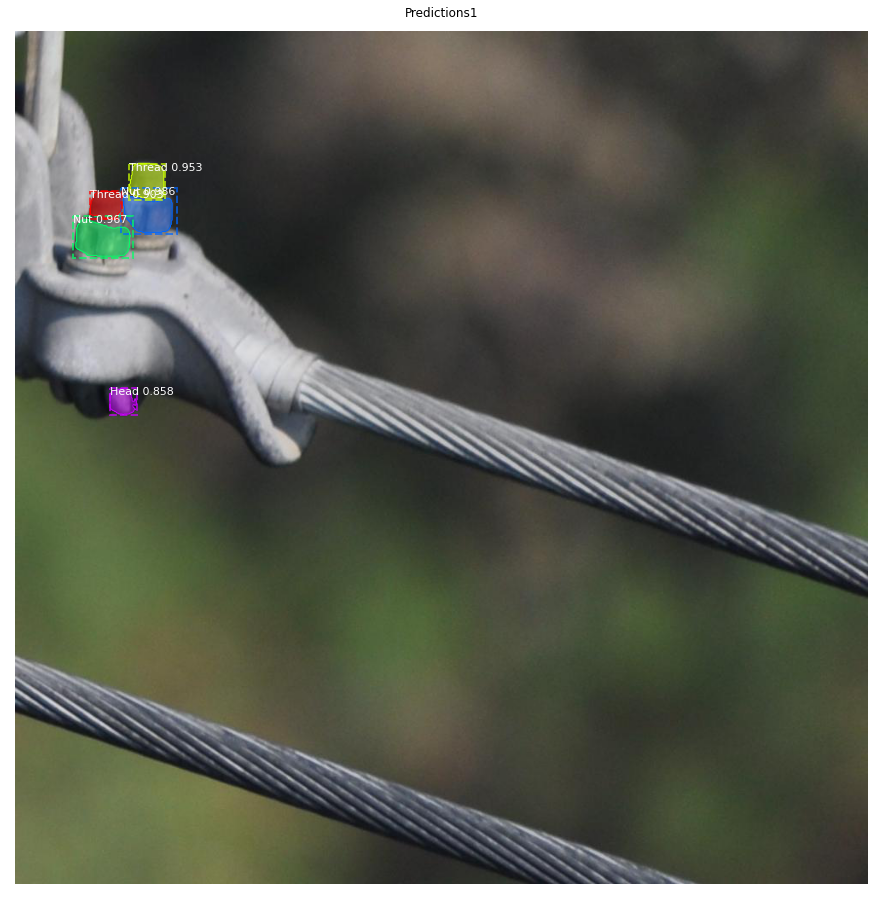

In [15]:
image1 = mpi.imread('/content/drive/MyDrive/project/dataset/val/img_2488_4_0.jpg')
print(len([image1]))
results1 = model.detect([image1], verbose=1)
ax = get_ax(1)
r1 = results1[0]
visualize.display_instances(image1, r1['rois'], r1['masks'], r1['class_ids'],
                            dataset.class_names, r1['scores'], ax=ax,
                            title="Predictions1")

Loading some random images from the data set and visualizing the image data like Head, Nut, Thread, Pin and Washer.

below we are are predicting 20 random images from val set which are not used for the training

image ID: object.img_2285_2_0.jpg (768) /content/drive/MyDrive/project/dataset/val/img_2285_2_0.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  251.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  147.10000  float64
image_metas              shape: (1, 18)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.17695  max:    1.11439  float32
gt_class_id              shape: (8,)                  min:    1.00000  max:    5.00000  int32
gt_bbox                  shape: (8, 4)                min:  155.00000  max:  920.00000  int32
gt_mask                  shape: (1024, 1024, 8)       min:    0.00000  max:    1.00000  uint8
image ID: object.img_2654_1_1.jpg (739) /content/drive/MyDrive/project/dataset/val/img_2654_1_1.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
mold

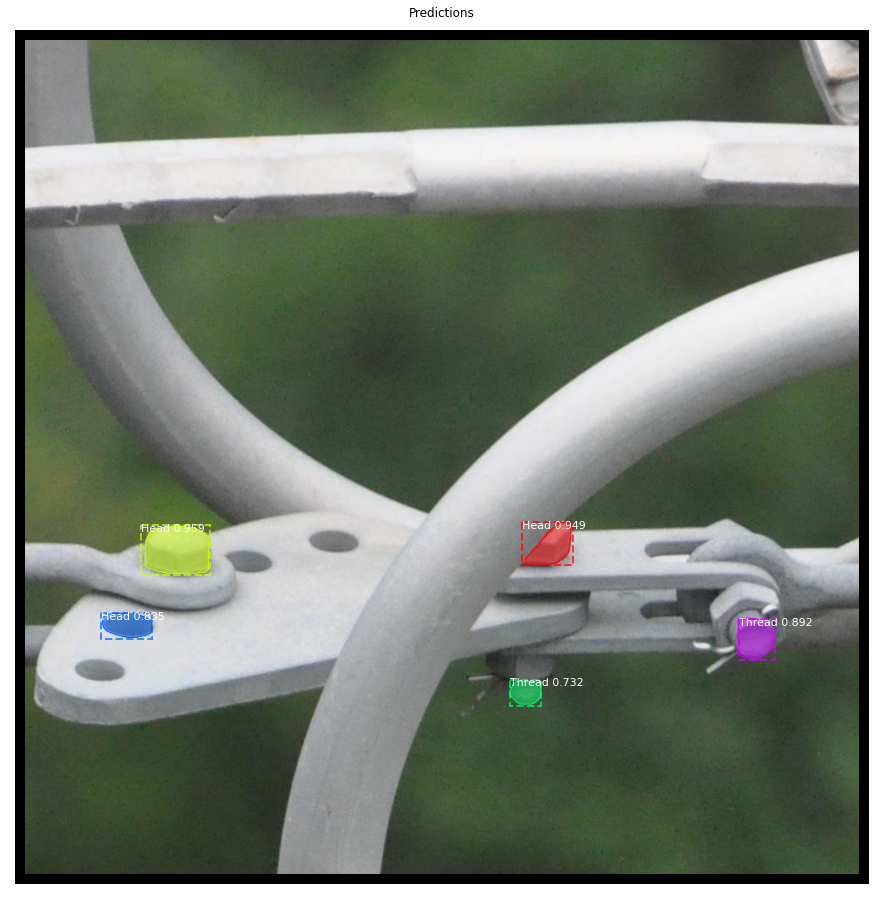

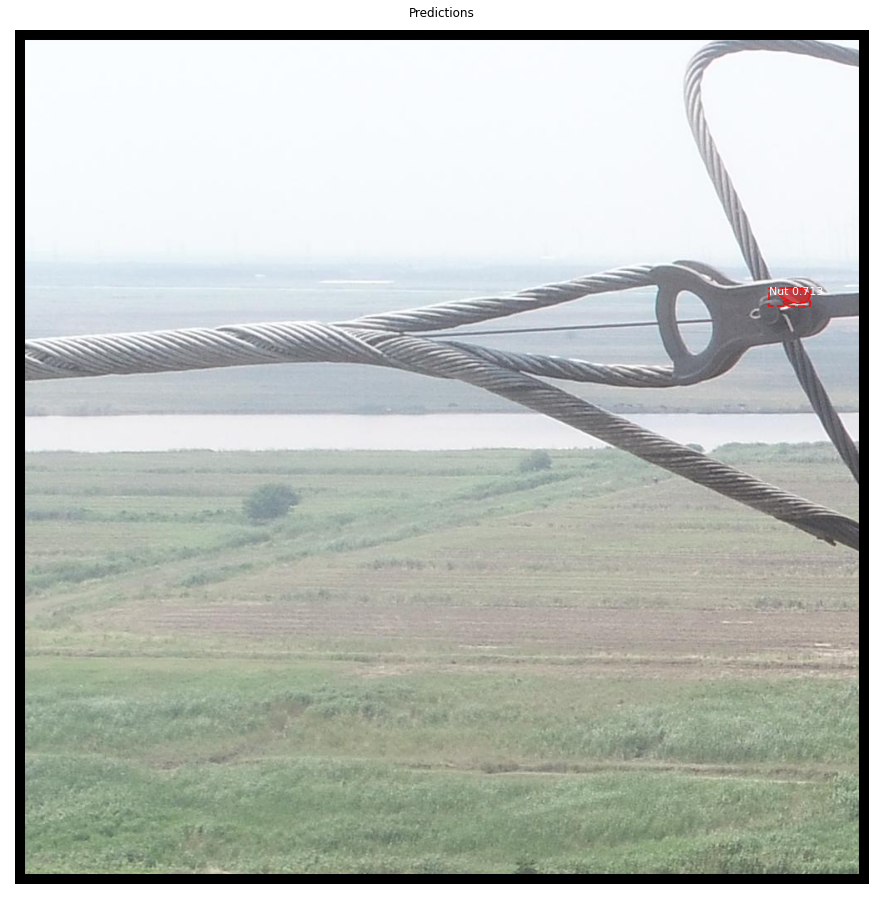

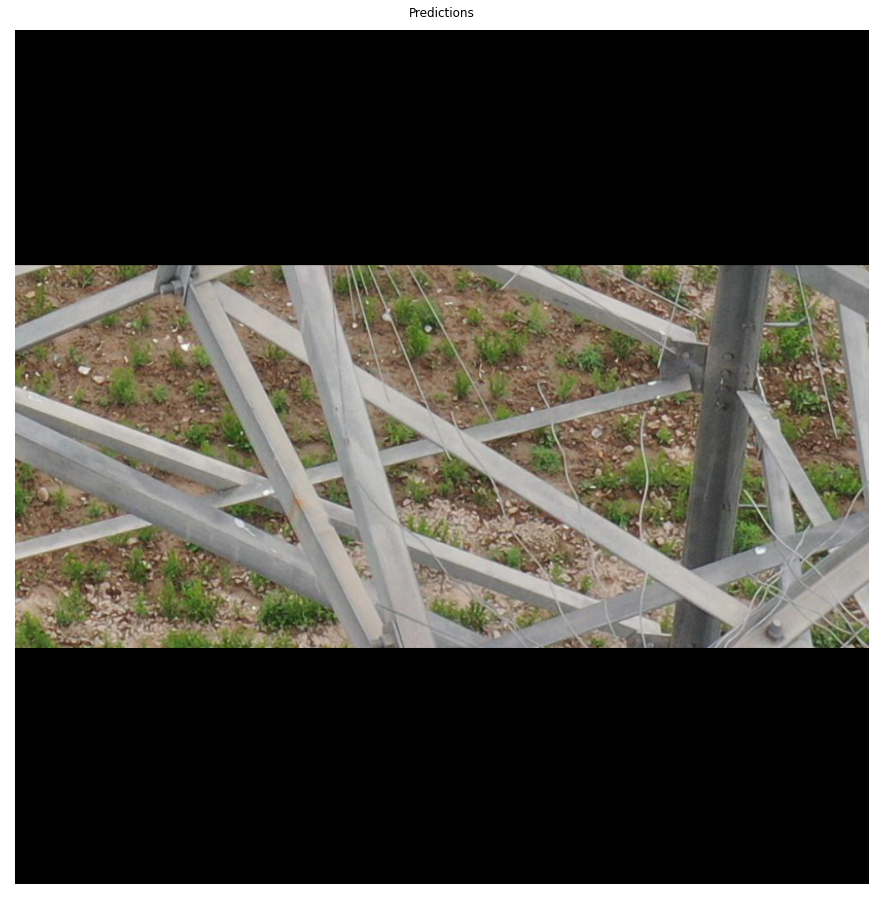

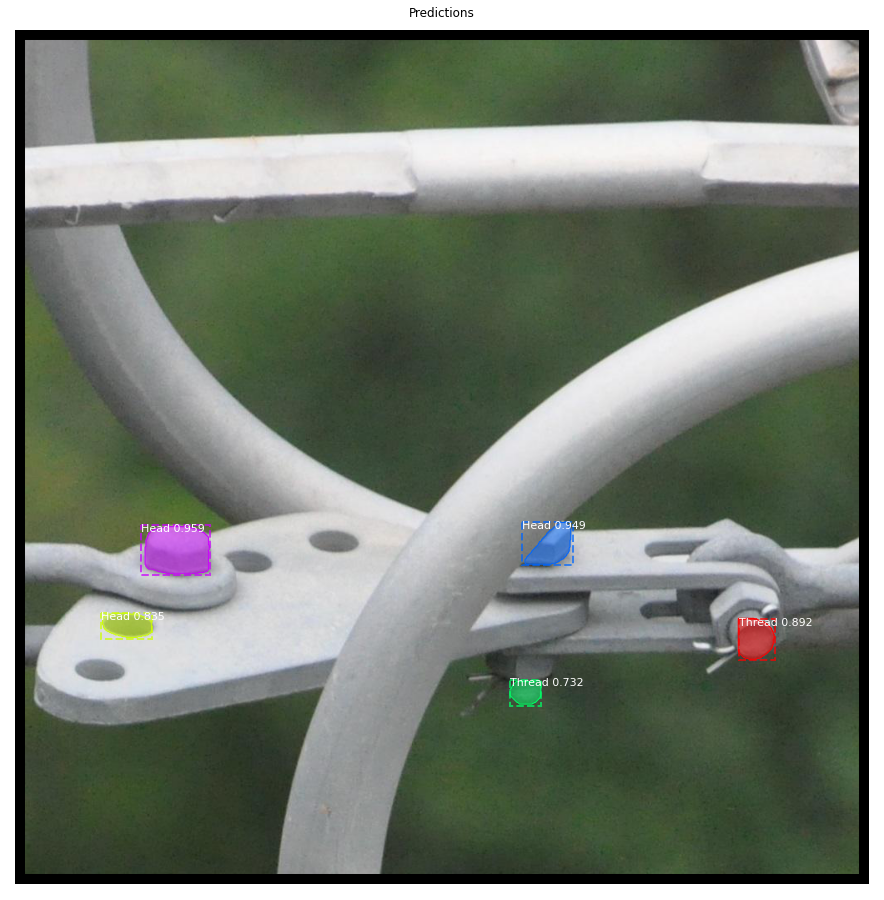

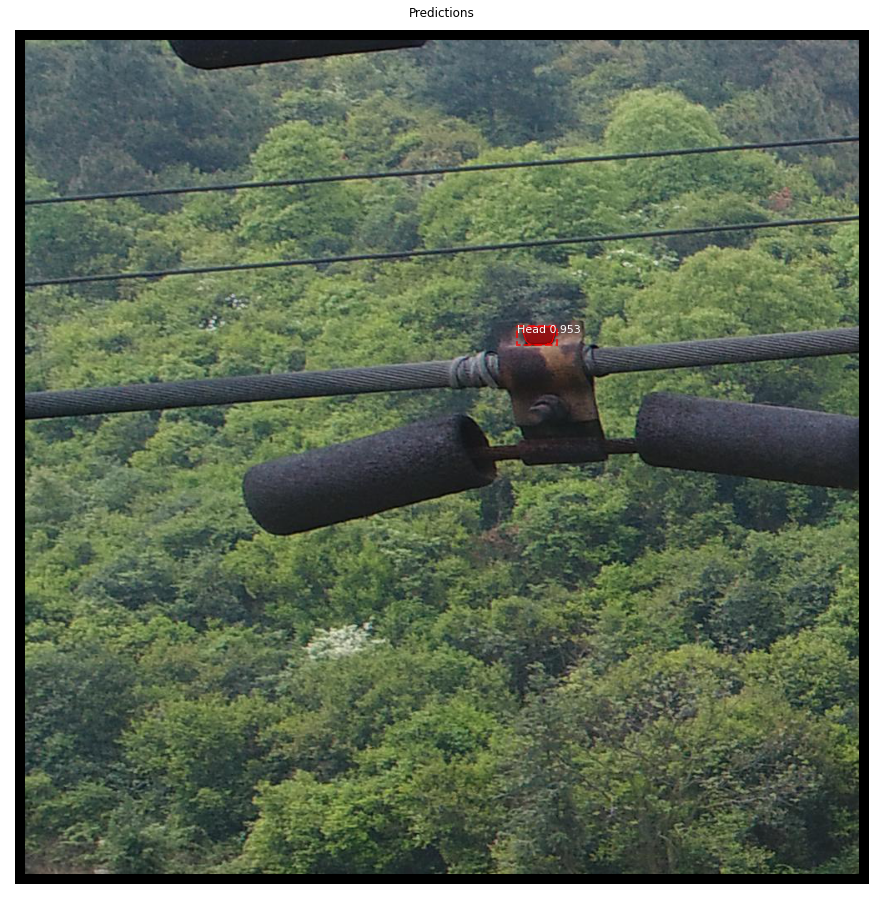

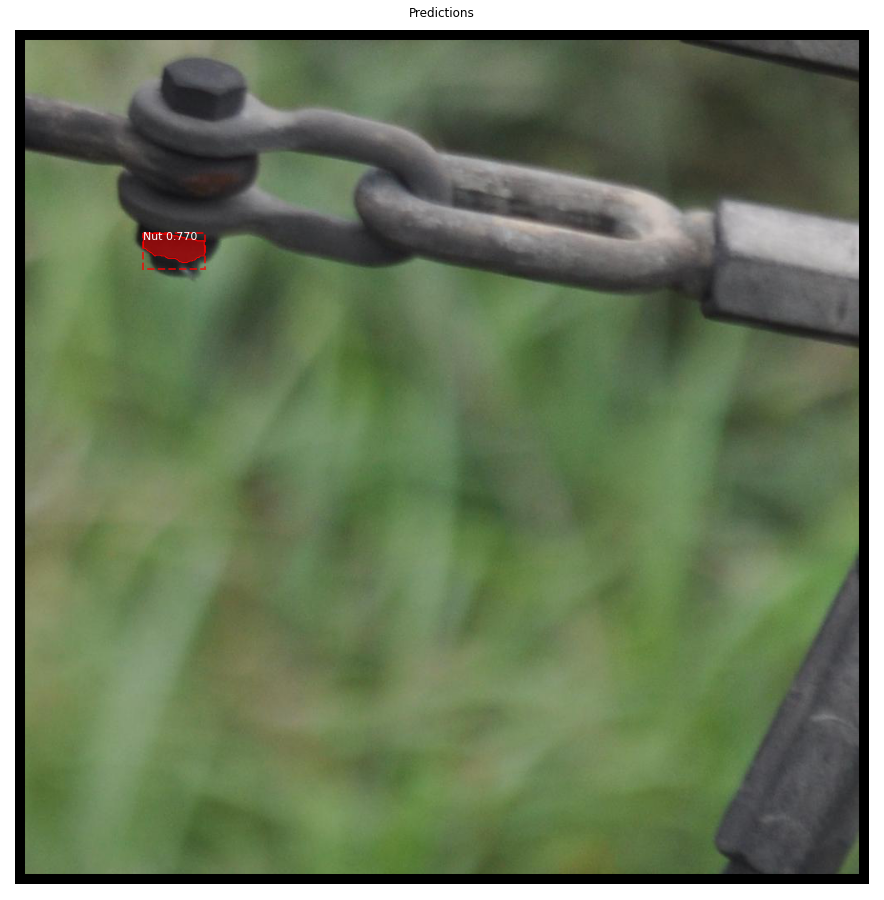

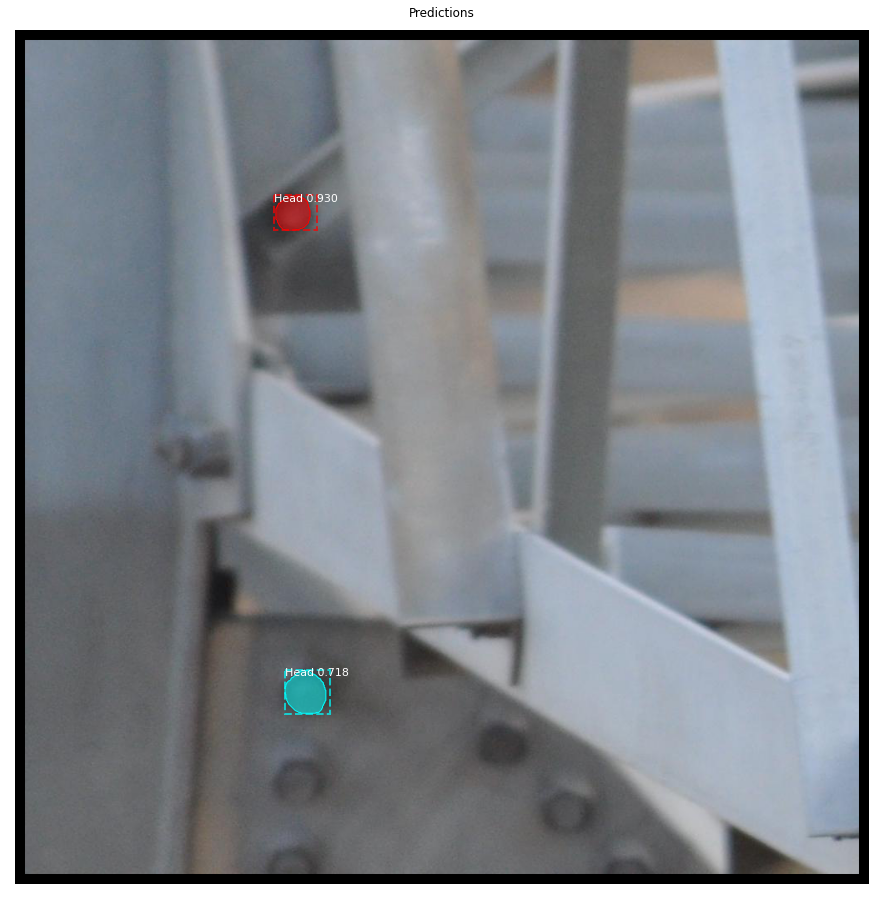

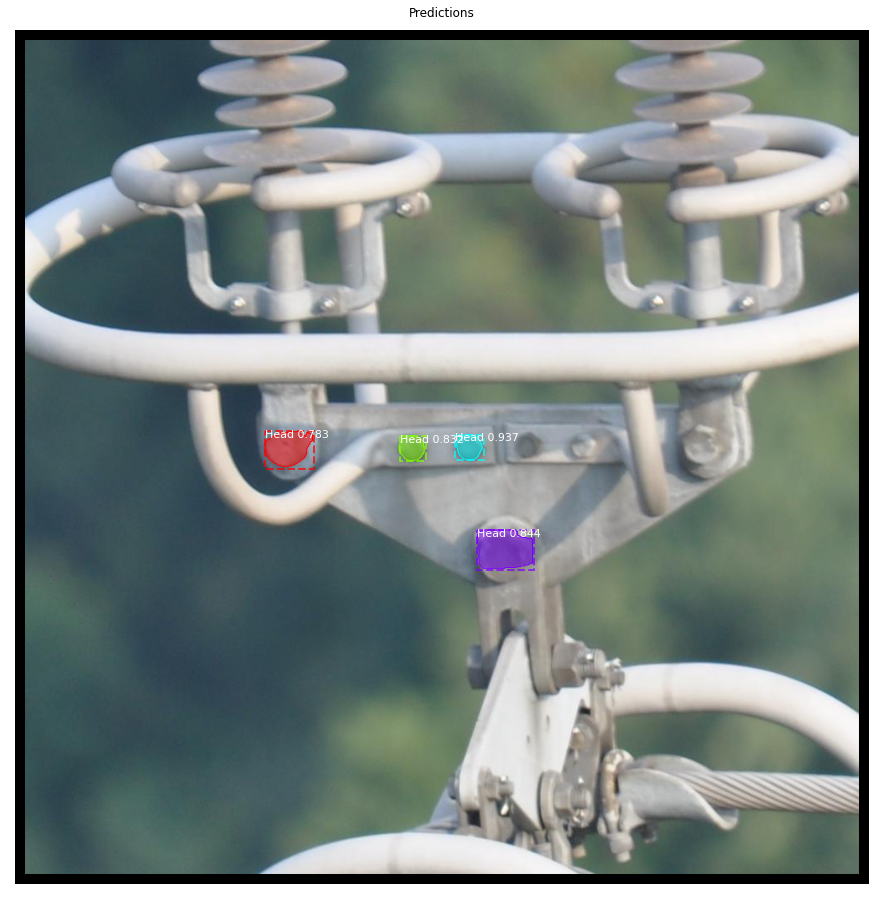

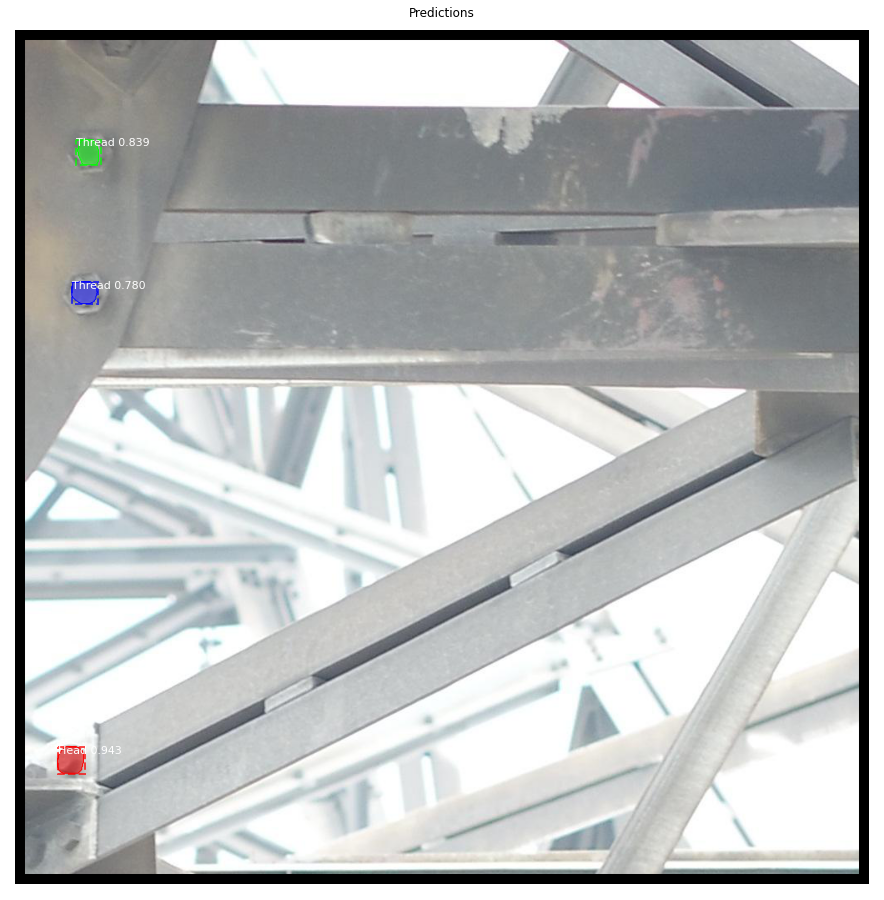

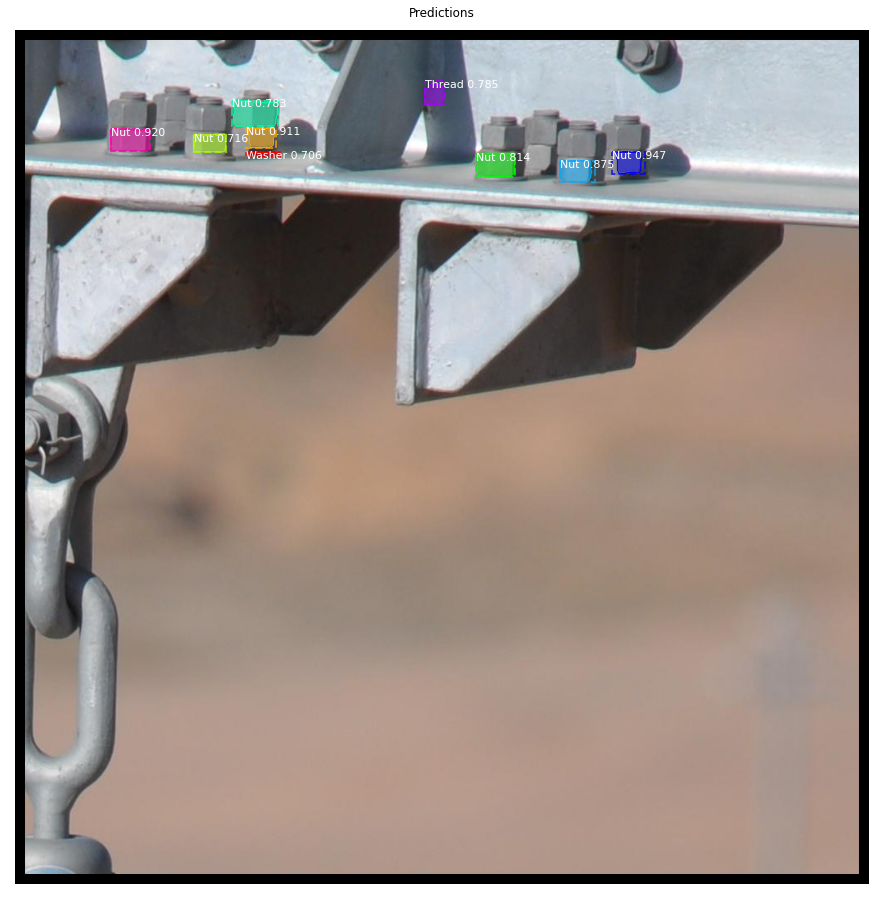

In [ ]:
for i in range(0,20):
  image_id = random.choice(dataset.image_ids)
  image, image_meta, gt_class_id, gt_bbox, gt_mask =\
      modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
  info = dataset.image_info[image_id]
  print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))
  results = model.detect([image], verbose=1)
  ax = get_ax(1)
  r = results[0]
  visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
  log("gt_class_id", gt_class_id)
  log("gt_bbox", gt_bbox)
  log("gt_mask", gt_mask)

